In [1]:
# install.packages('8_scHOT/scHOT_1.10.0.tar.gz', repos = NULL, type ='source')

library(scHOT)
library(SingleCellExperiment)
library(ggplot2)
library(scHOT)
library(scater)
library(matrixStats)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

In [9]:
db <- read.csv('melanoma/db_tbl2.csv')
row.names(db) <- db$X
db=db[,c('X','R1','R2')]

In [4]:
pos  <- read.csv('melanoma/data/pos.txt',header = FALSE)
row.names(pos)=colnames(null)
colnames(pos)=c('x','y')

In [ ]:
rbf = read.csv('rbf.csv', row.names = 1)
sps<- as(as.matrix(rbf), 'sparseMatrix')
scHOT_traj@weightMatrix = sps

In [377]:
null <- read.csv('melanoma/data/nul/NUL_data_noneg.csv', row.names = 1)

null=as.matrix(null)

scHOT_nul <- scHOT_buildFromMatrix(
  mat = null,
  cellData = as.matrix(pos),
  positionType = "spatial")
scHOT_nul

# scHOT_nul <- scHOT_addTestingScaffold(scHOT_nul, as.matrix(db))
scHOT_nul <- scHOT_addTestingScaffold(scHOT_nul, as.matrix(db[,c('X','R1')]))# 

class: scHOT 
dim: 1754 293 
metadata(0):
assays(1): expression
rownames(1754): IL24 COL4A2 ... COL4A1_8 WNT4_18
rowData names(0):
colnames(293): X0 X1 ... X291 X292
colData names(2): x y
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
testingScaffold dim: 0 0 
weightMatrix dim: 0 0 
scHOT_output colnames (0):
param names (0):
position type: spatial 

Warning message in scHOT_addTestingScaffold(scHOT_traj, as.matrix(db[, c("X", "R1")])):
“Some genes not found in data, removing these..”


In [427]:
# scHOT_nul <- scHOT_setWeightMatrix(scHOT_nul,
#                                        positionColData = c("x","y"),
#                                        positionType = "spatial",
#                                        nrow.out = NULL,
#                                        span = 0.1)
# rowSums(scHOT_nul@weightMatrix>0)

In [428]:
scHOT_nul <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_nul, 
  higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")

higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [429]:
# modified the higherOrderFunction to avoid na and the errors
scHOT_nul@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx==0) + (wssy==0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
  return(wcor)}
}

In [430]:
scHOT_nul <- scHOT_setPermutationScaffold(scHOT_nul, 
                                              numberPermutations = 50,
                                              numberScaffold = 10)

scHOT_nul <- scHOT_calculateHigherOrderTestStatistics(scHOT_nul)

slot(scHOT_nul, "scHOT_output")

higherOrderSummaryFunction will replace any stored param

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

In [431]:

system.time(scHOT_nul <- scHOT_performPermutationTest(
  scHOT_nul, 
  verbose = TRUE,
  parallel = FALSE))

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx * wssy):
“NaNs produced”
Warning message in sqrt(wssx

ERROR: Error in if (pval == 0) {: missing value where TRUE/FALSE needed


Timing stopped at: 14.41 0.184 14.47



In [ ]:
# scHOT_nul@params

scHOT_plotPermutationDistributions(scHOT_nul)

scHOT_nul <- scHOT_estimatePvalues(scHOT_nul,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_nul, "scHOT_output")



In [ ]:
write.csv(scHOT_nul@scHOT_output[,!(colnames(scHOT_nul@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_nul_res.csv')

In [ ]:
mat_half <- read.csv('melanoma/neg2pos/half/HALF_neg2pos.csv', row.names = 1)

mat_half=as.matrix(mat_half)

In [391]:
scHOT_half <- scHOT_buildFromMatrix(
  mat = mat_half,
  cellData = as.matrix(pos),
  positionType = "spatial")
scHOT_half <- scHOT_addTestingScaffold(scHOT_half, as.matrix(db[,c('X','R1')]))# 
scHOT_half@weightMatrix = sps

Warning message in scHOT_addTestingScaffold(scHOT_half, as.matrix(db[, c("X", "R1")])):
“Some genes not found in data, removing these..”


In [392]:
scHOT_half <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_half, 
    higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")

higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [402]:
scHOT_half@params$higherOrderFunction

function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}
<bytecode: 0x55c1282315f8>

In [408]:
scHOT_half@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx<=0) + (wssy<=0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
        print(wssx * wssy)
  return(wcor)}
}

higherOrderSummaryFunction will replace any stored param

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1] 7585.904
[1] 6.252717e-11
[1] 14786.44
[1] 1409.28
[1] 5764.148
[1] 26331.12
[1] 58475.18
[1] 46630.8
[1] 4211.987
[1] 1078.021
[1] 10309.35
[1] 72193.44
[1] 22704.15
[1] 401.7327
[1] 16177.05
[1] 43263.3
[1] 57266.37
[1] 12902.4
[1] 4.974916e-12
[1] 7.045533e-11
[1] 11929.1
[1] 77607.88
[1] 10072.2
[1] 8560.802
[1] 75657.76
[1] 88837.14
[1] 39105.14
[1] 296.7673
[1] 4.309732e-12
[1] 19211.41
[1] 65216.85
[1] 75954.56
[1] 68522.4
[1] 1481.906
[1] 222.6125
[1] 3467.9
[1] 17082.51
[1] 6.899668e-11
[1] 6.469576e-11
[1] 7.115324e-11
[1] 40220.04
[1] 104216.2
[1] 99233.4
[1] 37582.45
[1] 9844.351
[1] 548.3783
[1] 16231.44
[1] 22526.55
[1] 91663.47
[1] 51788.83
[1] 23165.6
[1] 54668.55
[1] 101756.6
[1] 53839.3
[1] 16063
[1] 4.830553e-12
[1] 36809.44
[1] 87273.26
[1] 38498.54
[1] 53811.07
[1] 21489.06
[1] 39093.78
[1] 46575.92
[1] 59282.93
[1] 22629.52
[1] 4.463252e-12
[1] 956.5812
[1] 26876.34
[1] 88294.63
[1] 50108.64
[1] 39863.68
[1] 52361.56
[1] 51046.03
[1] 44716.95
[1] 7.179985e-11


   user  system elapsed 
250.491   0.423 251.233 

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.099448”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.18429”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.0020882”
Warning message:
“Use of `permstatsDF$globalHigherOrderFunction` is discouraged. Use `globalHigherOrderFunction` instead.”
Warning message:
“Use of `permstatsDF$stat` is discouraged. Use `stat` instead.”
Warning message:
“Use of `df_toPlot$globalHigherOrderFunction` is discouraged. Use `globalHigherOrderFunction` instead.”
Warning m

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutat

DataFrame with 1179 rows and 15 columns
             gene_1      gene_2 globalHigherOrderFunction numberPermutations
        <character> <character>                  <matrix>          <numeric>
TGFB1_1     TGFB1_1      TGFBR1               -0.01128239                  0
TGFB2_1     TGFB2_1      TGFBR1               -0.04568785                  0
TGFB3_1     TGFB3_1      TGFBR1                0.02500782                  0
TGFB1_2     TGFB1_2      ACVR1B                0.03912410                  0
TGFB1_3     TGFB1_3      ACVR1C                0.00181946                  0
...             ...         ...                       ...                ...
THY1_3       THY1_3       ITGAV                -0.0121800                  0
TIGIT_1     TIGIT_1         PVR                 0.1372810                  0
TIGIT_2     TIGIT_2         PVR                -0.0431664                  0
TIGIT_3     TIGIT_3         PVR                 0.0733115                  0
ITGA4_1     ITGA4_1       VCAM1     

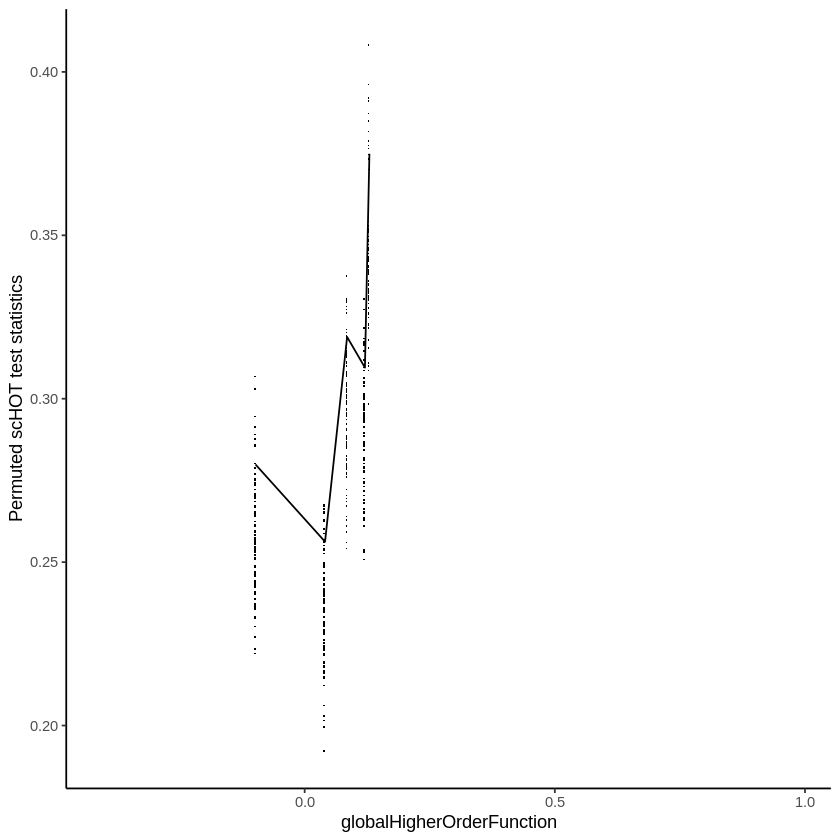

In [409]:

scHOT_half <- scHOT_calculateHigherOrderTestStatistics(scHOT_half)
system.time(scHOT_half <- scHOT_performPermutationTest(
  scHOT_half, 
  verbose = TRUE,
  parallel = FALSE))

# scHOT_half@params

scHOT_plotPermutationDistributions(scHOT_half)

scHOT_half <- scHOT_estimatePvalues(scHOT_half,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_half, "scHOT_output")

In [410]:
write.csv(scHOT_half@scHOT_output[,!(colnames(scHOT_half@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_half_res.csv')

In [ ]:
mat_full <- read.csv('melanoma/neg2pos/full/FULL_neg2pos.csv', row.names = 1)

mat_full=as.matrix(mat_full)

In [411]:
scHOT_full <- scHOT_buildFromMatrix(
  mat = mat_full,
  cellData = as.matrix(pos),
  positionType = "spatial")
scHOT_full <- scHOT_addTestingScaffold(scHOT_full, as.matrix(db[,c('X','R1')]))# 
scHOT_full@weightMatrix = sps

Warning message in scHOT_addTestingScaffold(scHOT_full, as.matrix(db[, c("X", "R1")])):
“Some genes not found in data, removing these..”


In [412]:
scHOT_full <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_full, 
  higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")

higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [413]:
scHOT_full@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx<=0) + (wssy<=0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
        print(wssx * wssy)
  return(wcor)}
}

higherOrderSummaryFunction will replace any stored param

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1] 481.7245
[1] 61.87388
[1] 1316.234
[1] 10801.98
[1] 29366.26
[1] 25164.11
[1] 11348.41
[1] 33331.8
[1] 31826.51
[1] 1479.56
[1] 2093.092
[1] 20355.36
[1] 32713.56
[1] 12333.14
[1] 2922.254
[1] 2.896786e-11
[1] 12223.94
[1] 5.74159e-12
[1] 7.58787e-11
[1] 6.537566e-11
[1] 12724.26
[1] 37892.76
[1] 50804.5
[1] 12006.83
[1] 4.024402e-12
[1] 20082.4
[1] 49720.55
[1] 37868.35
[1] 495.8402
[1] 4.665726e-12
[1] 7385.903
[1] 6.813505e-11
[1] 7.495405e-11
[1] 7.423795e-11
[1] 43772.48
[1] 53298.98
[1] 18155.35
[1] 22224.92
[1] 44350.39
[1] 36954.9
[1] 21477.17
[1] 5135.637
[1] 4.865281e-12
[1] 14779.37
[1] 58146.45
[1] 47412.55
[1] 25387.12
[1] 37935.88
[1] 53907.35
[1] 10959.47
[1] 4.727938e-12
[1] 7.867296e-11
[1] 38191.36
[1] 47765.57
[1] 39281.24
[1] 20365.26
[1] 59183.62
[1] 62931.54
[1] 11734.87
[1] 23965.99
[1] 38637.32
[1] 47421.93
[1] 48147.74
[1] 6.470985e-11
[1] 6.801898e-11
[1] 4.740497e-12
[1] 39.1819
[1] 59022.54
[1] 56006.53
[1] 34659.67
[1] 6.474899e-11
[1] 6.776719e-11
[1] 

   user  system elapsed 
224.027   0.264 224.574 

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 0.021603”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.075121”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.037818”
Warning message:
“Use of `permstatsDF$globalHigherOrderFunction` is discouraged. Use `globalHigherOrderFunction` instead.”
Warning message:
“Use of `permstatsDF$stat` is discouraged. Use `stat` instead.”
Warning message:
“Use of `df_toPlot$globalHigherOrderFunction` is discouraged. Use `globalHigherOrderFunction` instead.”
Warning me

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutat

DataFrame with 1179 rows and 15 columns
             gene_1      gene_2 globalHigherOrderFunction numberPermutations
        <character> <character>                  <matrix>          <numeric>
TGFB1_1     TGFB1_1      TGFBR1               0.006748215                  0
TGFB2_1     TGFB2_1      TGFBR1              -0.098130299                  0
TGFB3_1     TGFB3_1      TGFBR1               0.000176242                  0
TGFB1_2     TGFB1_2      ACVR1B              -0.012729575                  0
TGFB1_3     TGFB1_3      ACVR1C              -0.035785955                  0
...             ...         ...                       ...                ...
THY1_3       THY1_3       ITGAV                 0.1169205                  0
TIGIT_1     TIGIT_1         PVR                 0.0868500                  0
TIGIT_2     TIGIT_2         PVR                 0.0832411                  0
TIGIT_3     TIGIT_3         PVR                 0.0621264                  0
ITGA4_1     ITGA4_1       VCAM1     

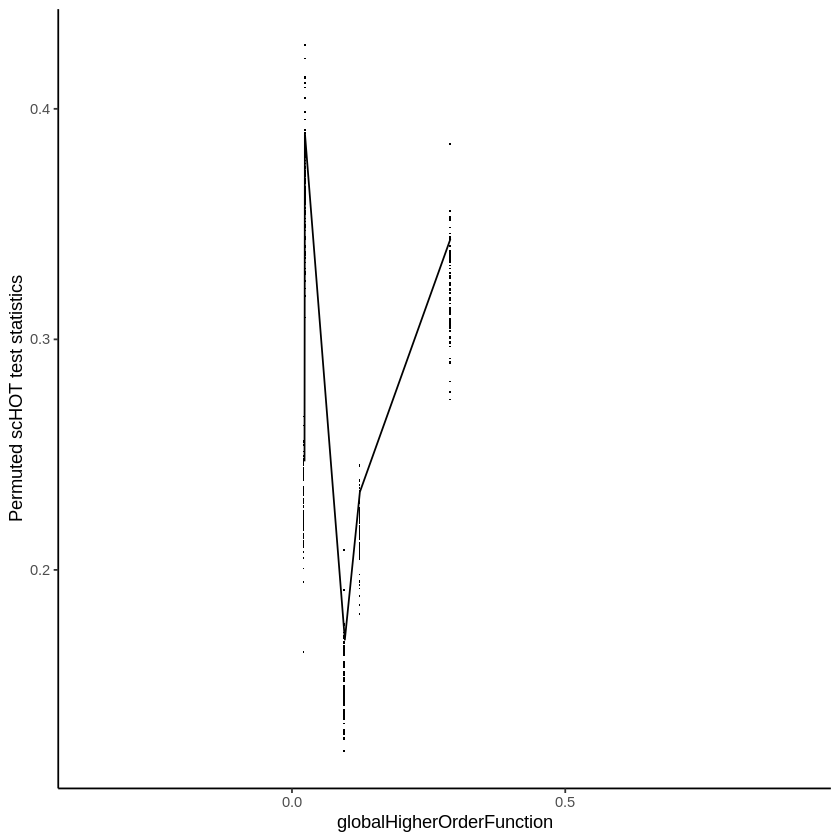

In [414]:
scHOT_full <- scHOT_setPermutationScaffold(scHOT_full, 
                                              numberPermutations = 100,
                                              numberScaffold = 10)

scHOT_full <- scHOT_calculateHigherOrderTestStatistics(scHOT_full)
system.time(scHOT_full <- scHOT_performPermutationTest(
  scHOT_full, 
  verbose = TRUE,
  parallel = FALSE))

# scHOT_full@params

scHOT_plotPermutationDistributions(scHOT_full)

scHOT_full <- scHOT_estimatePvalues(scHOT_full,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_full, "scHOT_output")

In [415]:
write.csv(scHOT_full@scHOT_output[,!(colnames(scHOT_full@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_full_res.csv')

In [339]:
mat_25 <- read.csv('melanoma/neg2pos/rescale25/RESCALE25.csv', row.names = 1)

mat_25=as.matrix(mat_25)

In [416]:
scHOT_25 <- scHOT_buildFromMatrix(
  mat = mat_25,
  cellData = as.matrix(pos),
  positionType = "spatial")
scHOT_25 <- scHOT_addTestingScaffold(scHOT_25, as.matrix(db[,c('X','R1')]))# 
scHOT_25@weightMatrix = sps

Warning message in scHOT_addTestingScaffold(scHOT_25, as.matrix(db[, c("X", "R1")])):
“Some genes not found in data, removing these..”


In [417]:
scHOT_25 <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_25, 
  higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")

higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [418]:
scHOT_25@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx<=0) + (wssy<=0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
        print(wssx * wssy)
  return(wcor)}
}

higherOrderSummaryFunction will replace any stored param

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1] 5.325915e-11
[1] 7.886177e-11
[1] 215.7797
[1] 2.680276e-11
[1] 7.592581e-11
[1] 4.618916e-12
[1] 1959.551
[1] 5.994068e-11
[1] 373.7005
[1] 26818.96
[1] 11600.99
[1] 7.878727e-11
[1] 4717.05
[1] 42128.67
[1] 26764.99
[1] 5.563482e-11
[1] 974.8917
[1] 68696.6
[1] 18123.62
[1] 304.3737
[1] 1134.665
[1] 1844.823
[1] 6814.13
[1] 21848.24
[1] 53841.5
[1] 36333.93
[1] 6.738113e-11
[1] 320.9326
[1] 4443.79
[1] 33889.08
[1] 47261.37
[1] 5.728971e-11
[1] 50916.38
[1] 33162.38
[1] 20040.21
[1] 7.314296e-11
[1] 0.6949727
[1] 1231.53
[1] 50625.97
[1] 74508.94
[1] 46093.81
[1] 37932.02
[1] 58539
[1] 35132.46
[1] 37862.45
[1] 52287.01
[1] 36607.89
[1] 2240.338
[1] 53754.1
[1] 81164.55
[1] 60015.58
[1] 17634.12
[1] 23031.41
[1] 43889.3
[1] 50809.93
[1] 22430.2
[1] 5.016157e-12
[1] 548.3783
[1] 43772.86
[1] 49566.19
[1] 15586.29
[1] 36539.63
[1] 62498.76
[1] 45592.92
[1] 17514.93
[1] 5.611082e-11
[1] 6997.512
[1] 61590.47
[1] 44332.64
[1] 36385.65
[1] 90478.29
[1] 72970.89
[1] 59325.25
[1] 30643.

   user  system elapsed 
284.719   0.523 285.614 

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.1023”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.18665”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.0035681”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“Chernobyl! trL>n 5”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“Chernobyl! trL>n 5”
Warning message in sqrt(sum.squares/one.delta):
“NaNs produced”
Warning message:
“Use of `permstatsDF$globalHigher

DataFrame with 1179 rows and 15 columns
             gene_1      gene_2 globalHigherOrderFunction numberPermutations
        <character> <character>                  <matrix>          <numeric>
TGFB1_1     TGFB1_1      TGFBR1                -0.0066427                  0
TGFB2_1     TGFB2_1      TGFBR1                -0.0179593                  0
TGFB3_1     TGFB3_1      TGFBR1                 0.0323114                  0
TGFB1_2     TGFB1_2      ACVR1B                 0.0311058                  0
TGFB1_3     TGFB1_3      ACVR1C                -0.1408852                  0
...             ...         ...                       ...                ...
THY1_3       THY1_3       ITGAV                0.09718621                  0
TIGIT_1     TIGIT_1         PVR                0.04417206                  0
TIGIT_2     TIGIT_2         PVR                0.00418079                  0
TIGIT_3     TIGIT_3         PVR               -0.01739546                  0
ITGA4_1     ITGA4_1       VCAM1     

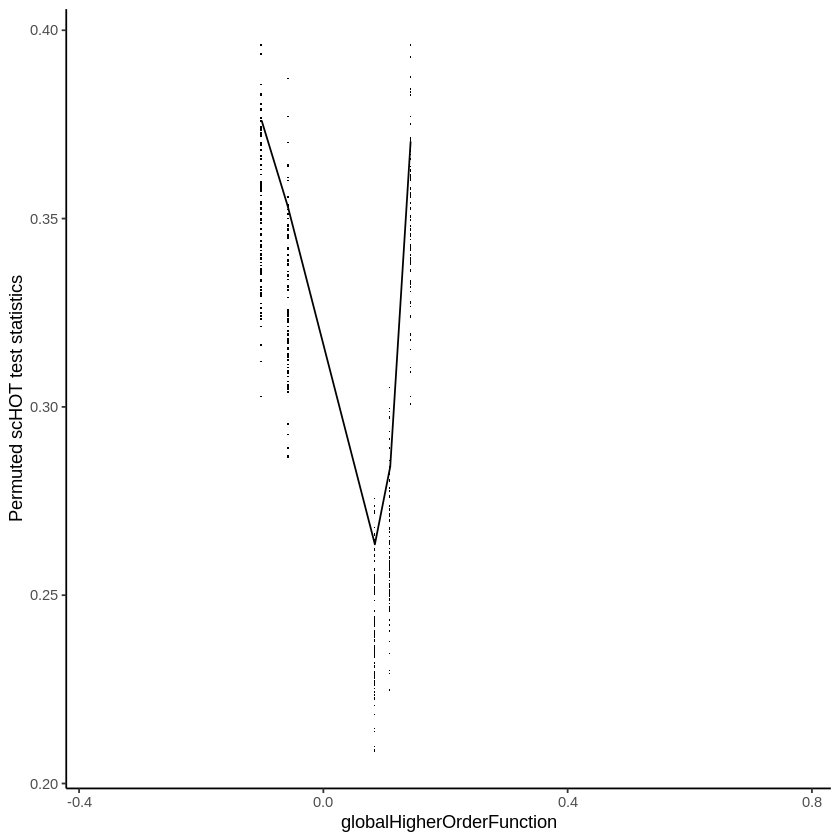

In [419]:
scHOT_25 <- scHOT_setPermutationScaffold(scHOT_25, 
                                              numberPermutations = 100,
                                              numberScaffold = 10)

scHOT_25 <- scHOT_calculateHigherOrderTestStatistics(scHOT_25)
system.time(scHOT_25 <- scHOT_performPermutationTest(
  scHOT_25, 
  verbose = TRUE,
  parallel = FALSE))

# scHOT_25@params

scHOT_plotPermutationDistributions(scHOT_25)

scHOT_25 <- scHOT_estimatePvalues(scHOT_25,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_25, "scHOT_output")

In [420]:
write.csv(scHOT_25@scHOT_output[,!(colnames(scHOT_25@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_25_res.csv')

In [344]:
mat_75 <- read.csv('melanoma/neg2pos/rescale75/RESCALE75.csv', row.names = 1)

mat_75=as.matrix(mat_75)

In [421]:
scHOT_75 <- scHOT_buildFromMatrix(
  mat = mat_75,
  cellData = as.matrix(pos),
  positionType = "spatial")
scHOT_75 <- scHOT_addTestingScaffold(scHOT_75, as.matrix(db[,c('X','R1')]))# 
scHOT_75@weightMatrix = sps

Warning message in scHOT_addTestingScaffold(scHOT_75, as.matrix(db[, c("X", "R1")])):
“Some genes not found in data, removing these..”


In [422]:
scHOT_75 <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_75, 
  higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")

higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [423]:
scHOT_75@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx<=0) + (wssy<=0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
        print(wssx * wssy)
  return(wcor)}
}

higherOrderSummaryFunction will replace any stored param

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1] 323.9734
[1] 1424.264
[1] 1447.549
[1] 533.5234
[1] 9206.786
[1] 44853.92
[1] 67292.5
[1] 4890.977
[1] 3.204653e-11
[1] 19080.42
[1] 13154.12
[1] 2387.079
[1] 1000.202
[1] 7.607007e-11
[1] 242.8813
[1] 6284.633
[1] 17326.79
[1] 3.438077e-11
[1] 6.533206e-11
[1] 3830.74
[1] 7.556225e-11
[1] 37468.34
[1] 32328.84
[1] 7.145199e-11
[1] 11282.3
[1] 67485.35
[1] 67394.18
[1] 47139.96
[1] 31473.06
[1] 132.6314
[1] 246.495
[1] 940.4046
[1] 39748.17
[1] 95200.32
[1] 90111.16
[1] 53938.39
[1] 27572.76
[1] 2137.761
[1] 379.8267
[1] 4.819791e-12
[1] 20191.33
[1] 39288.79
[1] 38253.77
[1] 22680.87
[1] 46839.28
[1] 118439
[1] 68886.4
[1] 104288.3
[1] 64749.66
[1] 59828.38
[1] 52804.59
[1] 5283.903
[1] 512.5843
[1] 13341.54
[1] 62846.8
[1] 127338.7
[1] 123390.4
[1] 72895.09
[1] 101588.6
[1] 85240.06
[1] 68334.48
[1] 102494.1
[1] 80153.3
[1] 38434.57
[1] 23002.47
[1] 78427.93
[1] 16014.99
[1] 1463.848
[1] 2659.781
[1] 55296.84
[1] 136048.8
[1] 80694.47
[1] 108416.1
[1] 115153.8
[1] 95377.52
[1] 48

   user  system elapsed 
208.297   0.456 209.026 

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 0.027801”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.076402”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.0019088”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“Chernobyl! trL>n 5”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“Chernobyl! trL>n 5”
Warning message in sqrt(sum.squares/one.delta):
“NaNs produced”
Warning message:
“Use of `permstatsDF$globalHigh

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutat

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutat

DataFrame with 1179 rows and 15 columns
             gene_1      gene_2 globalHigherOrderFunction numberPermutations
        <character> <character>                  <matrix>          <numeric>
TGFB1_1     TGFB1_1      TGFBR1                 0.0285379                  0
TGFB2_1     TGFB2_1      TGFBR1                -0.1021062                  0
TGFB3_1     TGFB3_1      TGFBR1                -0.0679848                  0
TGFB1_2     TGFB1_2      ACVR1B                 0.0280933                  0
TGFB1_3     TGFB1_3      ACVR1C                 0.0431746                  0
...             ...         ...                       ...                ...
THY1_3       THY1_3       ITGAV                0.08205492                  0
TIGIT_1     TIGIT_1         PVR                0.04278701                  0
TIGIT_2     TIGIT_2         PVR                0.07302470                  0
TIGIT_3     TIGIT_3         PVR                0.11097555                  0
ITGA4_1     ITGA4_1       VCAM1     

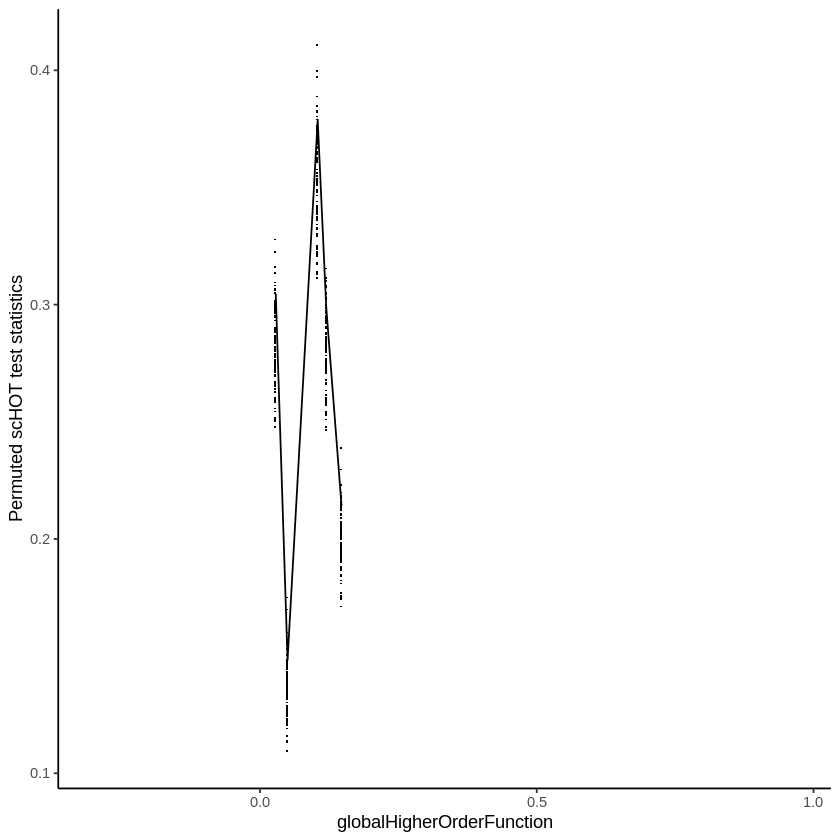

In [424]:
scHOT_75 <- scHOT_setPermutationScaffold(scHOT_75, 
                                              numberPermutations = 100,
                                              numberScaffold = 10)

scHOT_75 <- scHOT_calculateHigherOrderTestStatistics(scHOT_75)
system.time(scHOT_75 <- scHOT_performPermutationTest(
  scHOT_75, 
  verbose = TRUE,
  parallel = FALSE))

# scHOT_75@params

scHOT_plotPermutationDistributions(scHOT_75)

scHOT_75 <- scHOT_estimatePvalues(scHOT_75,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_75, "scHOT_output")

In [425]:
write.csv(scHOT_75@scHOT_output[,!(colnames(scHOT_75@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_75_res.csv')

In [330]:
sum(scHOT_half@scHOT_output$pvalEstimated<0.05)

[1] 154

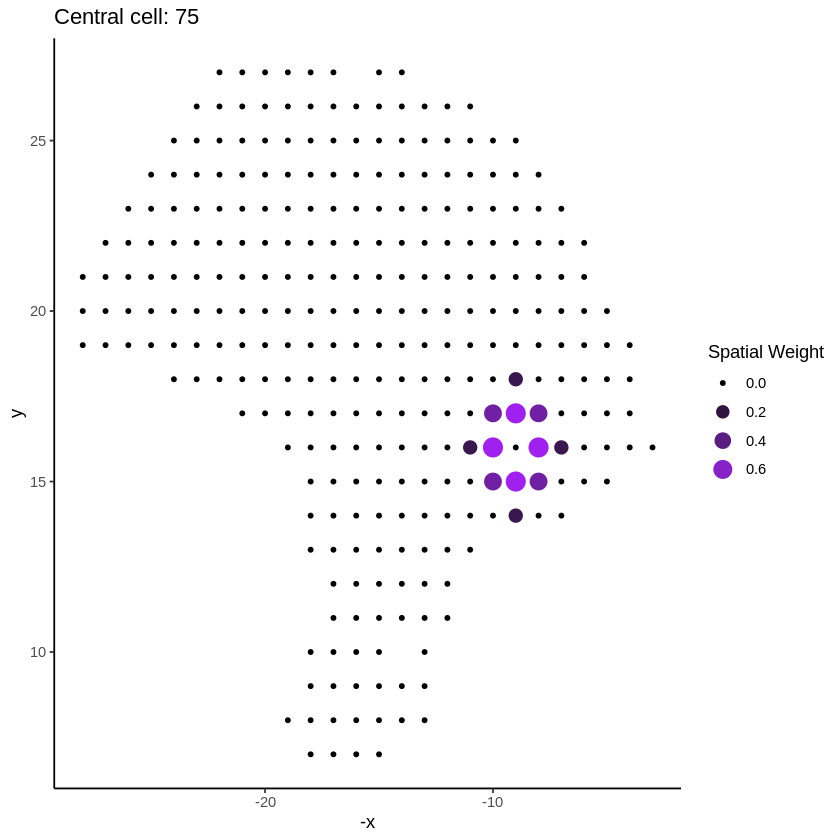

In [114]:
cellID = 75
ggplot(as.data.frame(colData(scHOT_traj)), aes(x = -x, y = y)) + 
  geom_point(aes(colour = slot(scHOT_traj, "weightMatrix")[cellID,],
                 size = slot(scHOT_traj, "weightMatrix")[cellID,])) + 
  scale_colour_gradient(low = "black", high = "purple") + 
  scale_size_continuous(range = c(1,5)) +
  theme_classic() +
  guides(colour = guide_legend(title = "Spatial Weight"),
         size = guide_legend(title = "Spatial Weight")) + 
    ggtitle(paste0("Central cell: ", cellID))

In [432]:
shuffled_pairs = read.csv('/home/yoyo/1_spatial/1_Tumor/neg_ctr_allmethods.csv')

mel <- readRDS('/home/yoyo/1_spatial/spatial-datasets-master/data/rds/2018_thrane_melanoma/ST_mel1_rep2.rds')

scHOT_mel <- scHOT_buildFromSCE(mel,
                                    assayName = "logcounts",
                                    positionType = "spatial",
                                    positionColData = c("row", "col"))

scHOT_mel <- scHOT_addTestingScaffold(scHOT_mel, as.matrix(shuffled_pairs[,c('ligand', 'receptor')]))
scHOT_mel@testingScaffold

scHOT_mel@weightMatrix = sps

scHOT_mel <- scHOT_calculateGlobalHigherOrderFunction(
  scHOT_mel, 
  higherOrderFunction = weightedSpearman,
  higherOrderFunctionType = "weighted")
scHOT_mel@params$higherOrderFunction = function(x, y, w = 1) {

  if (length(x) != length(y)) {
    stop("x and y should have the same length")
  }
  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  keep = w > 0

  xr = rank(x[keep])
  yr = rank(y[keep])
  R = weightedPearson(x = xr, y = yr, w = w[keep])
}

weightedPearson = function(x, y, w = 1) {

  if (length(x) != length(y)) stop("data must be the same length")

  if (length(w) == 1) {
    w <- rep(w, length(x))
  }

  nw = sum(w)
  wssx = nw * sum(w * (x^2)) - sum(w * x)^2
  wssy = nw * sum(w * (y^2)) - sum(w * y)^2
  wssxy = nw * sum(w * x * y) - sum(w * x) * sum(w * y)
    if ((wssx<=0) + (wssy<=0)){
        return(0)
    }
    else{
  wcor = wssxy/sqrt(wssx * wssy)
        print(wssx * wssy)
  return(wcor)}
}

gene_1,gene_2
TGFB1,ITGA6
TGFB3,CD4
TGFB1,ITGA3
TGFB3,FZD4
TGFB3,ITGA3
TGFB1,TLR4
TGFB3,ITGA1
BMP2,MADCAM1
BMP2,FGFR2
BMP2,CD4


higherOrderFunctionType given will replace any stored param

higherOrderFunction given will replace any stored param



In [433]:
scHOT_mel@testingScaffold = scHOT_mel@testingScaffold[is.na(scHOT_mel@scHOT_output$globalHigherOrderFunction)==FALSE,]

scHOT_mel@scHOT_output = scHOT_mel@scHOT_output[is.na(scHOT_mel@scHOT_output$globalHigherOrderFunction)==FALSE,]



scHOT_mel <- scHOT_setPermutationScaffold(scHOT_mel, 
                                              numberPermutations = 50,
                                              numberScaffold = 10)


scHOT_mel <- scHOT_calculateHigherOrderTestStatistics(scHOT_mel)


system.time(scHOT_mel <- scHOT_performPermutationTest(
  scHOT_mel, 
  verbose = TRUE,
  parallel = FALSE))

scHOT_mel <- scHOT_estimatePvalues(scHOT_mel,
                                       nperm_estimate = 100,
                                       maxDist = 0.1)
slot(scHOT_mel, "scHOT_output")

Warning message in NSBS(i, x, exact = exact, strict.upper.bound = !allow.append, :
“subscript is an array, passing it thru as.vector() first”
higherOrderSummaryFunction will replace any stored param



[1] 80.48564
[1] 64.72439
[1] 35.67108
[1] 35.67108
[1] 287.7458
[1] 64.72439
[1] 146.0394
[1] 151.9072
[1] 151.9072
[1] 151.1872
[1] 163.6479
[1] 505.9111
[1] 153.0707
[1] 64.72439
[1] 64.72439
[1] 328.0043
[1] 286.2812
[1] 327.4785
[1] 151.9072
[1] 117.441
[1] 434.5487
[1] 119.8982
[1] 452.1698
[1] 388.8412
[1] 196.4884
[1] 83.71949
[1] 531.0267
[1] 421.8466
[1] 596.8109
[1] 128.9029
[1] 327.4785
[1] 117.441
[1] 596.8109
[1] 64.72439
[1] 64.72439
[1] 64.72439
[1] 428.4927
[1] 384.0793
[1] 122.0177
[1] 83.71949
[1] 35.67108
[1] 88.2741
[1] 83.71949
[1] 298.8908
[1] 386.6083
[1] 164.7255
[1] 296.9356
[1] 277.7434
[1] 253.177
[1] 253.177
[1] 253.177
[1] 327.4785
[1] 327.4785
[1] 323.2015
[1] 259.91
[1] 153.0707
[1] 153.0707
[1] 35.67108
[1] 146.0394
[1] 191.1954
[1] 117.441
[1] 64.72439
[1] 83.71949
[1] 322.7014
[1] 322.7014
[1] 137.4961
[1] 529.9863
[1] 120.3064
[1] 83.71949
[1] 622.8236
[1] 64.72439
[1] 253.4319
[1] 122.2463
[1] 324.7975
[1] 83.71949
[1] 266.2777
[1] 337.5682
[1] 314.

[1] 453.7974
[1] 2757.263
[1] 2262.718
[1] 357.3805
[1] 89.36666
[1] 2070.076
[1] 34598.76
[1] 79290.55
[1] 54273.5
[1] 6062.751
[1] 12.27077
[1] 403.2696
[1] 13257.01
[1] 63235.48
[1] 112524.3
[1] 70515.21
[1] 6181.741
[1] 2591.16
[1] 35055.62
[1] 53349.85
[1] 36846.1
[1] 279.7213
[1] 120.3064
[1] 3953.488
[1] 41221.66
[1] 55813.36
[1] 50776.6
[1] 4636.404
[1] 4827.308
[1] 62355.72
[1] 49983.02
[1] 93305.23
[1] 69236.44
[1] 11202.67
[1] 1353.011
[1] 20508.66
[1] 111881.9
[1] 97639.45
[1] 92204.45
[1] 76448.16
[1] 26650.69
[1] 422.3865
[1] 405.6459
[1] 2178.462
[1] 5319.37
[1] 7077.384
[1] 23782.47
[1] 107260.3
[1] 92307.69
[1] 101546.1
[1] 138011.4
[1] 120319.8
[1] 70332.52
[1] 339.6856
[1] 4047.966
[1] 26312.76
[1] 64106.17
[1] 62236.72
[1] 51032.67
[1] 89441.6
[1] 63822.06
[1] 84449.11
[1] 97757.6
[1] 97803.72
[1] 104596.6
[1] 61045.59
[1] 14313.7
[1] 891.3639
[1] 23996.88
[1] 57033.05
[1] 91614
[1] 60068.3
[1] 37465.63
[1] 31421.96
[1] 93739.26
[1] 81281.52
[1] 105661.8
[1] 98334.5

   user  system elapsed 
191.503   2.391 209.408 

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutations instead

no permutations found within given maxDist... using all permutat

DataFrame with 664 rows and 15 columns
         gene_1      gene_2 globalHigherOrderFunction numberPermutations
    <character> <character>                  <matrix>          <numeric>
1         TGFB1       ITGA6                -0.0187137                  0
2         TGFB3         CD4                 0.0320410                  0
3         TGFB1       ITGA3                 0.0606366                  0
4         TGFB3        FZD4                -0.0346693                  0
5         TGFB3       ITGA3                -0.0161448                  0
...         ...         ...                       ...                ...
660     SIGLEC1       EPHA2                -0.0753555                  0
661        THY1        FZD1                -0.0137761                  0
662        THY1       ITGA8                 0.0259822                  0
663       ITGA4       CD244                -0.0155807                  0
664       ITGA9        NRP1                -0.0748964                  0
    storePer

In [434]:
write.csv(scHOT_mel@scHOT_output[,!(colnames(scHOT_mel@scHOT_output) %in% 
                                     c('higherOrderSequence', 'permutations'))], 
          file='8_scHOT/scHOT_mel_neg_res.csv')